# Machine Learning and EDA Model on WHO Life Expectancy Data

#### Importing all the required Library

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Library for Machine learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import Ridge ,Lasso
from sklearn.model_selection import GridSearchCV,cross_val_score

In [3]:
# Data and Visulization library 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot')
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio

#### Reading Dataset

In [4]:
WHOdata=pd.read_csv("Life Expectancy Data.csv")
WHOdata.head(2)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0


In [5]:
WHOdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
Country                            2938 non-null object
Year                               2938 non-null int64
Status                             2938 non-null object
Life expectancy                    2928 non-null float64
Adult Mortality                    2928 non-null float64
infant deaths                      2938 non-null int64
Alcohol                            2744 non-null float64
percentage expenditure             2938 non-null float64
Hepatitis B                        2385 non-null float64
Measles                            2938 non-null int64
 BMI                               2904 non-null float64
under-five deaths                  2938 non-null int64
Polio                              2919 non-null float64
Total expenditure                  2712 non-null float64
Diphtheria                         2919 non-null float64
 HIV/AIDS                          2938 non-null

#### Renaming columns for easy of use

In [6]:
WHOdata.rename(columns={'Status':'Is_developing',
                         'Life expectancy ':'Life_expectancy',
                         'Adult Mortality':'Adult_Mortality',
                         'infant deaths':'infant_deaths',
                         'percentage expenditure':'percentage_expenditure', 
                         'Hepatitis B':'Hepatitis_B',
                         'Measles ':'Measles',
                         ' BMI ':'BMI',
                         'under-five deaths ':'deaths_u5',
                         'Total expenditure':'Total_expenditure',
                         'Diphtheria ':'Diphtheria',
                         ' HIV/AIDS':'HIV/AIDS',
                         ' thinness  1-19 years':'thinness_u19',
                         ' thinness 5-9 years':'thinness_u9',
                         'Income composition of resources':'Income_composition'},inplace=True)

In [7]:
WHOdata.columns

Index(['Country', 'Year', 'Is_developing', 'Life_expectancy',
       'Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure',
       'Hepatitis_B', 'Measles', 'BMI', 'deaths_u5', 'Polio',
       'Total_expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population',
       'thinness_u19', 'thinness_u9', 'Income_composition', 'Schooling'],
      dtype='object')

#### Changing Status column
Developing=1
Developed=0

In [8]:
WHOdata.Is_developing.value_counts()

Developing    2426
Developed      512
Name: Is_developing, dtype: int64

In [9]:
WHOdata.Is_developing=WHOdata.Is_developing.astype("category").cat.codes

#### Checking for Null values

In [10]:
Null_val=pd.DataFrame(round(100*WHOdata.isna().sum()/len(WHOdata),2)).reset_index()
Null_val.columns=["col","null_pc"]
Null_val=Null_val.loc[Null_val.null_pc>0].sort_values(by="null_pc")
Null_val=Null_val.col
Null_val

3        Life_expectancy
4        Adult_Mortality
12                 Polio
14            Diphtheria
10                   BMI
18          thinness_u19
19           thinness_u9
21             Schooling
20    Income_composition
6                Alcohol
13     Total_expenditure
16                   GDP
8            Hepatitis_B
17            Population
Name: col, dtype: object

In [11]:
country_list = WHOdata.Country.unique()
fill_list = Null_val.tolist()
fill_list

['Life_expectancy',
 'Adult_Mortality',
 'Polio',
 'Diphtheria',
 'BMI',
 'thinness_u19',
 'thinness_u9',
 'Schooling',
 'Income_composition',
 'Alcohol',
 'Total_expenditure',
 'GDP',
 'Hepatitis_B',
 'Population']

#### Filling up Null values

In [12]:
## Interpolating data in Nullcols
## Here we here Interpolating countrywise
for country in country_list:
    WHOdata.loc[WHOdata['Country'] == country,fill_list] = WHOdata.loc[WHOdata['Country'] == country,fill_list].interpolate()
WHOdata.dropna(inplace=True)

In [13]:
WHOdata.isna().sum()

Country                   0
Year                      0
Is_developing             0
Life_expectancy           0
Adult_Mortality           0
infant_deaths             0
Alcohol                   0
percentage_expenditure    0
Hepatitis_B               0
Measles                   0
BMI                       0
deaths_u5                 0
Polio                     0
Total_expenditure         0
Diphtheria                0
HIV/AIDS                  0
GDP                       0
Population                0
thinness_u19              0
thinness_u9               0
Income_composition        0
Schooling                 0
dtype: int64

## Visulizing Data

In [14]:
WHOdata.columns

Index(['Country', 'Year', 'Is_developing', 'Life_expectancy',
       'Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure',
       'Hepatitis_B', 'Measles', 'BMI', 'deaths_u5', 'Polio',
       'Total_expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population',
       'thinness_u19', 'thinness_u9', 'Income_composition', 'Schooling'],
      dtype='object')

In [15]:
## LIst for Box plot
box_lst=['Life_expectancy','Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure',
       'Hepatitis_B', 'Measles', 'BMI', 'deaths_u5', 'Polio',
       'Total_expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population',
       'thinness_u19', 'thinness_u9', 'Income_composition', 'Schooling']

In [16]:
for var in box_lst:
    fig=px.box(WHOdata,y=var,notched=True,color=WHOdata.Is_developing,log_y=True)
    fig.show()

In [17]:
for var in box_lst:
    fig=px.histogram(WHOdata,x=var,facet_col=WHOdata.Is_developing,color=WHOdata.Is_developing)
    fig.show()

In [18]:
for var in box_lst:
    q75, q25 = np.percentile(WHOdata[var], [75 ,25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    print("Number of outliers and percentage of it in {} : {} and {}".
          format(var,len((np.where((WHOdata[var] > max_val) | (WHOdata[var] < min_val))[0])),
                          len((np.where((WHOdata[var] > max_val) | (WHOdata[var] < min_val))[0]))*100/1987))

Number of outliers and percentage of it in Life_expectancy : 4 and 0.20130850528434827
Number of outliers and percentage of it in Adult_Mortality : 58 and 2.9189733266230498
Number of outliers and percentage of it in infant_deaths : 198 and 9.96477101157524
Number of outliers and percentage of it in Alcohol : 3 and 0.1509813789632612
Number of outliers and percentage of it in percentage_expenditure : 232 and 11.675893306492199
Number of outliers and percentage of it in Hepatitis_B : 216 and 10.870659285354806
Number of outliers and percentage of it in Measles : 361 and 18.16809260191243
Number of outliers and percentage of it in BMI : 0 and 0.0
Number of outliers and percentage of it in deaths_u5 : 227 and 11.424257674886764
Number of outliers and percentage of it in Polio : 159 and 8.002013085052843
Number of outliers and percentage of it in Total_expenditure : 13 and 0.6542526421741318
Number of outliers and percentage of it in Diphtheria : 195 and 9.813789632611979
Number of outlier

In [19]:
### Code for Reducing outlier

In [20]:
## BAR PLOT

In [21]:
countrygrp = WHOdata.groupby('Country').mean().sort_values(by="Life_expectancy",ascending=True).reset_index()
countrygrp
px.bar(countrygrp,x="Country",y="Life_expectancy",color="Country",height=1000,width=2000)

In [22]:
## Countrywis and Year Wise Graph Can be Created with Animation to compare trend

In [23]:
yeargrp = WHOdata.groupby('Year').mean().sort_values(by="Life_expectancy",ascending=True).reset_index()
yeargrp
fig1=px.bar(yeargrp,x="Year",y="Life_expectancy",color="Year")
fig1.show()
fig2=px.line(yeargrp,x="Year",y="GDP",)
fig2.show()

In [24]:
##
for var in countrygrp.columns:
    fig=px.scatter(countrygrp,x=var,y=countrygrp.Life_expectancy,labels={'x':var,'Life_expectancy':"Life Expectancy"},
               title="{} vs. Life Expectancy ".format(var),trendline='OLS')
    fig.show()

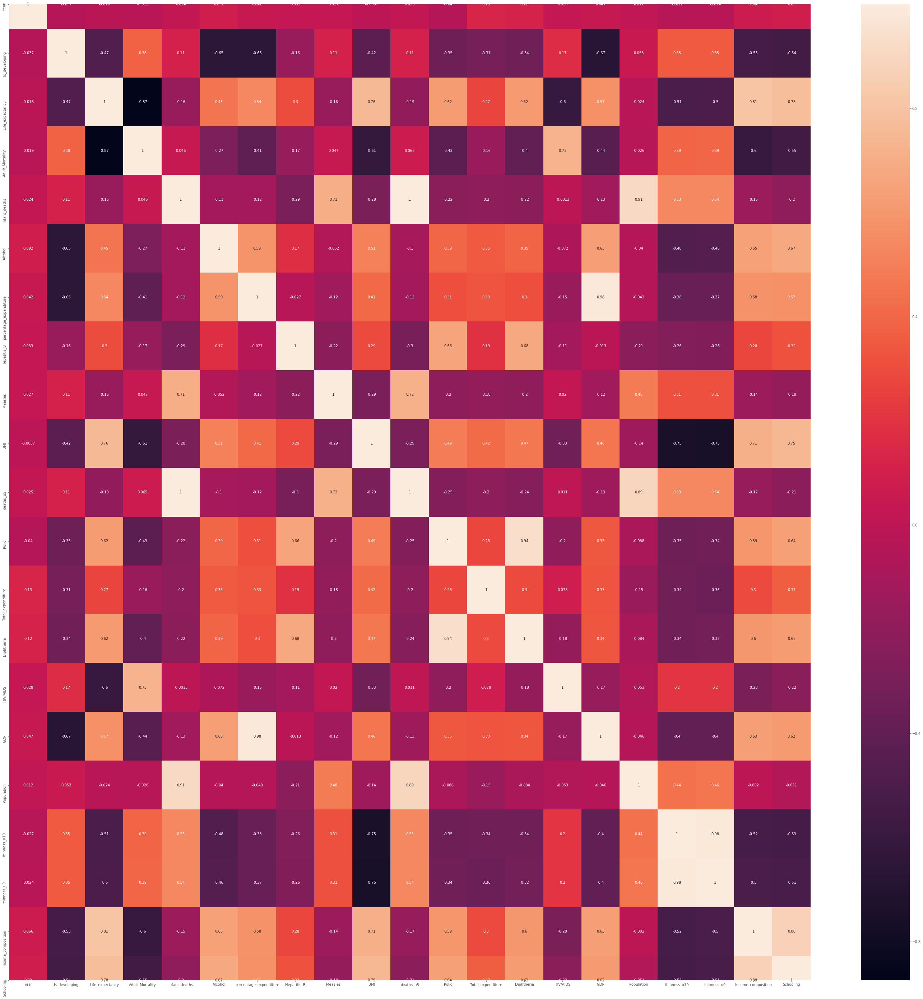

In [25]:
plt.figure(figsize = (50,50))
sns.heatmap(countrygrp.corr(),annot=True)
plt.show()

In [26]:
px.imshow(countrygrp.corr())

## Applying Linear regression

### 1. Model Using PCA

In [27]:
df_WHO=WHOdata
df_WHO.drop("Country",axis=1,inplace=True)

In [28]:
df_trainpca, df_testpca = train_test_split(df_WHO, train_size = 0.7, test_size = 0.3, random_state = 100)

In [29]:
## Scaling the data using StandardScaler scaler
scalerpca = StandardScaler()
# applying scaling to all numerical variables
num_varspca = ['Year','Life_expectancy', 'Adult_Mortality',
               'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B',
               'Measles', 'BMI', 'deaths_u5', 'Polio', 'Total_expenditure',
               'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness_u19',
               'thinness_u9', 'Income_composition', 'Schooling']

df_trainpca[num_varspca] = scalerpca.fit_transform(df_trainpca[num_varspca])
df_testpca[num_varspca] = scalerpca.transform(df_testpca[num_varspca])

In [30]:
## we can retrive original using below code or scaler.inverse_transform
## means = scalerpca.mean_ 
## varns = scalerpca.var_
## print("means=",means,"\n")
## print("varns=",varns,"\n")

#def scale_data(array,means=means,stds=vars **0.5):
#    return (array-means)/stds
#scale_new_data = scale_data(new_data)

In [31]:
trnY=df_trainpca.pop('Life_expectancy')
trnX=df_trainpca

tstY=df_testpca.pop('Life_expectancy')
tstX=df_testpca

In [32]:
print(trnX.shape)
print(trnY.shape)
print(tstX.shape)
print(tstY.shape)

(1390, 20)
(1390,)
(597, 20)
(597,)


In [33]:
## Applying
from sklearn.decomposition import PCA
pca=PCA(n_components=2)

In [34]:
trnX=pca.fit_transform(trnX)
tstX=pca.transform(tstX)
print(trnX.shape)
print(tstX.shape)

(1390, 2)
(597, 2)


In [35]:
trnX = sm.add_constant(trnX)
tstX = sm.add_constant(tstX)

In [36]:
lmpca = sm.OLS(trnY,trnX).fit()   # Running the linear model
print(lmpca.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_expectancy   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.663
Method:                 Least Squares   F-statistic:                     1369.
Date:                Sun, 17 May 2020   Prob (F-statistic):               0.00
Time:                        18:10:43   Log-Likelihood:                -1215.0
No. Observations:                1390   AIC:                             2436.
Df Residuals:                    1387   BIC:                             2452.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -9.159e-16      0.016  -5.88e-14      1.0

Text(0.5, 0, 'Errors')

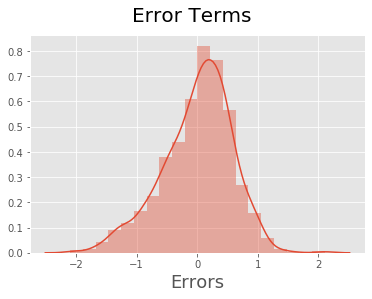

In [37]:
# Predicting on trining set 
y_trainpca_pred = lmpca.predict(trnX)
# Plot the histogram of the error terms
fig = plt.figure()
res=(trnY - y_trainpca_pred)
sns.distplot(res, bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)   

In [38]:
from sklearn.metrics import r2_score
print (r2_score(trnY, y_trainpca_pred))

0.663679499520198


In [39]:
from sklearn.metrics import r2_score
y_testpca_pred = lmpca.predict(tstX)
print (r2_score(tstY, y_testpca_pred))

0.6511309450999536


#### With PCA , Error distribution is Skewed to Right
#### Also R2 Valve is bit lower side
#### We need to select Feature Manually

#### 2. Without PCA

In [40]:
df_train, df_test = train_test_split(df_WHO, train_size = 0.7, test_size = 0.3, random_state = 100)

In [41]:
## Scaling the data using StandardScaler scaler
scaler = StandardScaler()
# applying scaling to all numerical variables
num_vars = ['Year','Life_expectancy','Adult_Mortality',
               'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B',
               'Measles', 'BMI', 'deaths_u5', 'Polio', 'Total_expenditure',
               'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness_u19',
               'thinness_u9', 'Income_composition', 'Schooling']

df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [42]:
## We can retrive original using below code or scaler.inverse_transform
means = scaler.mean_ 
varns = scaler.var_
scaleTable=pd.DataFrame()
scaleTable["Variable"]=df_train[num_varspca].columns
scaleTable["means"]=scaler.mean_
scaleTable["varns"]=scaler.var_
## This table cane be usefull at later stage if we need to retrivce scalling after preparing model
scaleTable.head(3)

# From Below mentioned data cab be retrived
#def scale_data(scaledData,mean,varns):
#    data=scaledData
#    means=mean
#    stds=varns**0.5
#    original=(data*stds)+means
#    return original
#scale_data(0.972476,67.896475,93.502556)

,Variable,means,varns
0,Year,2007.011511,18.679004
1,Life_expectancy,67.896475,93.502556
2,Adult_Mortality,177.237410,17001.251550


In [43]:
y_train= df_train.pop('Life_expectancy')
X_train= df_train

y_test= df_test.pop('Life_expectancy')
X_test= df_test

#### We are using Recursice Feature Elimination for Course Feature selection
#### We need to try Number of Selection in order to Create Accurate model

In [44]:
# Recursice Feature Elimination -  This the automatic technic. for Selecting Feture
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [45]:
#all the columns
# list(zip(X_train.columns,rfe.support_,rfe.ranking_))
# Columns rejected by RFE
#X_train.columns[~rfe.support_]

In [46]:
# Columns selected by RFE
## Storing Column list which are Accepeted by RFE
col = X_train.columns[rfe.support_]
## Selecting Colums which are selected by RFE
X_train = X_train[col]

In [47]:
## Creating Dummy column for Intercept
X_train = sm.add_constant(X_train)

In [48]:
lm = sm.OLS(y_train,X_train, axis=1).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_expectancy   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     677.0
Date:                Sun, 17 May 2020   Prob (F-statistic):               0.00
Time:                        18:10:47   Log-Likelihood:                -737.60
No. Observations:                1390   AIC:                             1497.
Df Residuals:                    1379   BIC:                             1555.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [49]:
## Now we will Check VIF value
X_train_vif = X_train.drop(['const',"Is_developing","deaths_u5"], axis=1)
# Calculate the VIFs for the new model
VIF=pd.Series([variance_inflation_factor(X_train_vif.values, i) 
               for i in range(X_train_vif.shape[1])], 
              index=X_train_vif.columns)

print(VIF.sort_values(ascending=False))

Schooling                 3.427504
Income_composition        3.075555
BMI                       1.671316
Adult_Mortality           1.625916
HIV/AIDS                  1.371583
percentage_expenditure    1.280337
Diphtheria                1.274935
infant_deaths             1.086886
dtype: float64


In [50]:
X_train1=X_train.drop(["Is_developing","infant_deaths","deaths_u5"],axis=1)
lm1 = sm.OLS(y_train,X_train1,axis=1).fit()   # Running the linear model
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_expectancy   R-squared:                       0.819
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     896.0
Date:                Sun, 17 May 2020   Prob (F-statistic):               0.00
Time:                        18:10:48   Log-Likelihood:                -782.68
No. Observations:                1390   AIC:                             1581.
Df Residuals:                    1382   BIC:                             1623.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                  -9.15

#### Life Expe= (-0.2215)Adult_Mortality + (0.0574)percentage_expenditure + (0.1252)BMI + (0.0830)Diphtheria + (-0.2912)HIV/AIDS +(0.1771)Income_composition + (0.3251)Schooling

In [51]:
scaleTable.loc[(scaleTable.Variable=="Adult_Mortality") | (scaleTable.Variable=="percentage_expenditure") |
              (scaleTable.Variable=="BMI") | (scaleTable.Variable=="Diphtheria") |
              (scaleTable.Variable=="HIV/AIDS") | (scaleTable.Variable=="Income_composition") |
              (scaleTable.Variable=="Schooling")]

,Variable,means,varns
2,Adult_Mortality,177.237410,1.700125e+04
5,percentage_expenditure,638.718987,2.539624e+06
8,BMI,36.371151,3.891800e+02
12,Diphtheria,80.292086,5.778197e+02
13,HIV/AIDS,2.193381,3.516042e+01
18,Income_composition,0.601969,4.131646e-02
19,Schooling,11.614460,1.007055e+01


In [52]:
## From Above Values Using below commented function Regression equ. can re be rescaled to original

# From Below mentioned data cab be retrived
#def scale_data(scaledData,mean,varns):
#    data=scaledData
#    means=mean
#    stds=varns**0.5
#    original=(data*stds)+means
#    return original
#scale_data(0.972476,67.896475,93.502556)

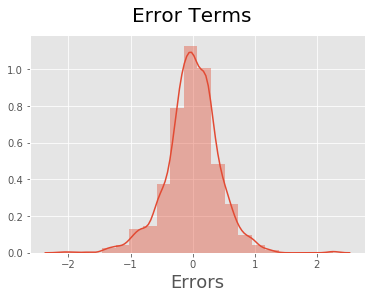

In [53]:
# Predicting on trining set 
y_train_pred = lm1.predict(X_train1)
# Plot the histogram of the error terms
fig = plt.figure()
res=(y_train - y_train_pred)
sns.distplot(res, bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  
trainTable=pd.DataFrame()
trainTable["y_train"]=y_train
trainTable["y_train_pred"]=y_train_pred
trainTable.reset_index(inplace=True)

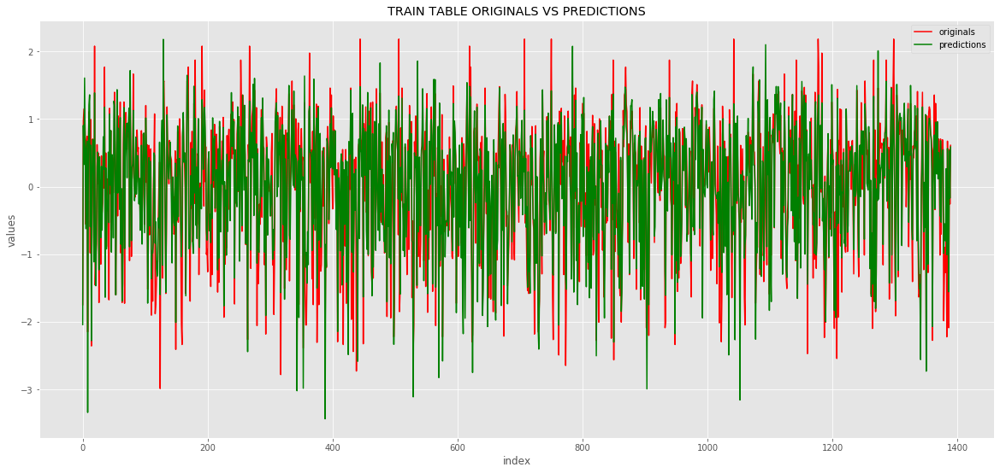

In [54]:
plt.figure(figsize = (20,9))
ax =sns.lineplot(label="originals",x=trainTable.index,y=trainTable["y_train"],color="r")
ax = sns.lineplot(label = "predictions",x=trainTable.index,y=trainTable["y_train_pred"],color="g")
plt.legend(loc='upper right')
plt.title("TRAIN TABLE ORIGINALS VS PREDICTIONS")
plt.xlabel("index")
plt.ylabel("values")
plt.show()

Text(0, 0.5, 'y_pred')

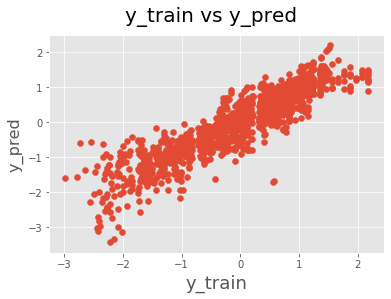

In [55]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_train,y_train_pred)
fig.suptitle('y_train vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_train', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)   

## From Above Two graph we can say that 
-- Error is Normally disdrubuted
-- And there is no variance in error

In [56]:
print("Train DS R2 Value :",r2_score(y_train, y_train_pred))
print("Train DS Mean_Squared_Error",mean_squared_error(y_train, y_train_pred))
print("Train DS Mean_Absolute_Error",mean_absolute_error(y_train, y_train_pred))

Train DS R2 Value : 0.8194446654258787
Train DS Mean_Squared_Error 0.18055533457412135
Train DS Mean_Absolute_Error 0.3152739872655836


#### Prediction on Test Data

In [57]:
# Creating X_test_new dataframe by dropping variables from X_test
# Adding a constant variable 
X_test = sm.add_constant(X_test)

In [58]:
# Creating X_test_new dataframe by dropping variables from X_test
X_test = X_test[X_train1.columns]

In [59]:
# Making predictions


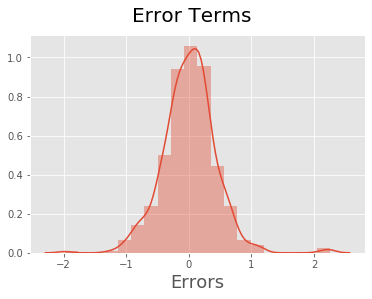

In [60]:
# Predicting on testing set 
y_test_pred = lm1.predict(X_test)
# Plot the histogram of the error terms
fig = plt.figure()
res=(y_test - y_test_pred)
sns.distplot(res, bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  
testTable=pd.DataFrame()
testTable["y_test"]=y_train
testTable["y_test_pred"]=y_train_pred
testTable.reset_index(inplace=True)

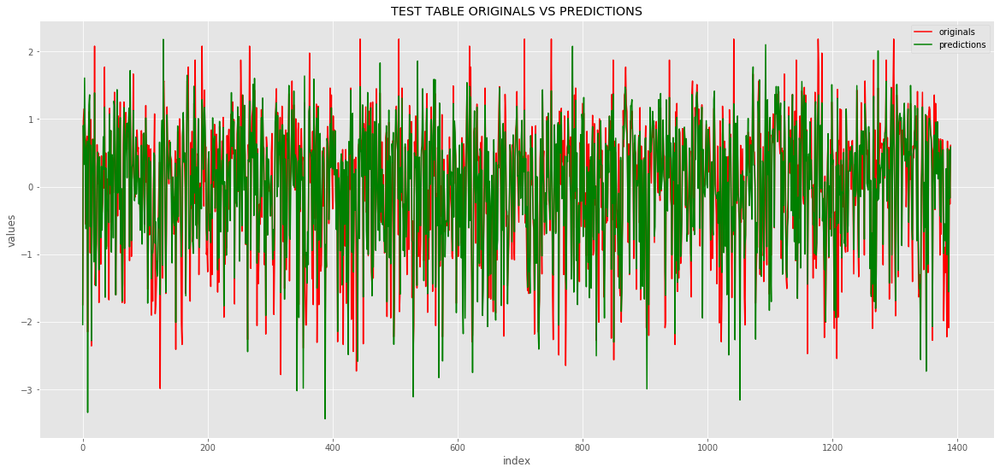

In [61]:
plt.figure(figsize = (20,9))
ax =sns.lineplot(label="originals",x=testTable.index,y=testTable["y_test"],color="r")
ax = sns.lineplot(label = "predictions",x=testTable.index,y=testTable["y_test_pred"],color="g")
plt.legend(loc='upper right')
plt.title("TEST TABLE ORIGINALS VS PREDICTIONS")
plt.xlabel("index")
plt.ylabel("values")
plt.show()

Text(0, 0.5, 'y_pred')

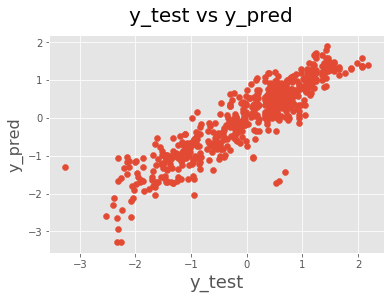

In [62]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_test_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                       # Y-label

## From Above graphs we can say that 
-- Error is Normally disdrubuted
-- And there is no variance in error

In [63]:
print("Test DS R2 Value :",r2_score(y_test, y_test_pred))
print("Test DS Mean_Squared_Error",mean_squared_error(y_test, y_test_pred))
print("Test DS Mean_Absolute_Error",mean_absolute_error(y_test, y_test_pred))

Test DS R2 Value : 0.8209731215844712
Test DS Mean_Squared_Error 0.18315197322686683
Test DS Mean_Absolute_Error 0.3181292828953324


## Machine Learning With sklearn
## Lasso and Ridge Regresison not available in statemodel.api

#### 3. Lasso Regression

In [64]:
df_train, df_test = train_test_split(df_WHO, train_size = 0.7, test_size = 0.3, random_state = 100)

In [65]:
## Scaling the data using StandardScaler scaler
scaler = StandardScaler()
# applying scaling to all numerical variables
num_vars = ['Year','Life_expectancy','Adult_Mortality',
               'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B',
               'Measles', 'BMI', 'deaths_u5', 'Polio', 'Total_expenditure',
               'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness_u19',
               'thinness_u9', 'Income_composition', 'Schooling']

df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [66]:
y_train= df_train.pop('Life_expectancy')
X_train= df_train

y_test= df_test.pop('Life_expectancy')
X_test= df_test

In [67]:
## Lasso Regression , CUrrenty Same is not available in statemodel.api 

alphas = np.logspace(-3,3,num=14) # range for alpha

grid = GridSearchCV(estimator=Lasso(), param_grid=dict(alpha=alphas))
grid.fit(X_train,y_train)

print(grid.best_score_)
print(grid.best_estimator_.alpha)

0.8242156702881009
0.001


In [68]:
r_2=[]
CV=[]
ls = Lasso(alpha = grid.best_estimator_.alpha, normalize = True) # applied the best estimator
lmLso=ls.fit(X_train,y_train)
predicts=lmLso.predict(X_test)
prediction=pd.DataFrame(predicts)

R_2=r2_score(y_test,prediction)
cross_val=cross_val_score(lmLso,X_train,y_train,cv=5)
    
# Appending results to Lists 
r_2.append(R_2)
CV.append(cross_val.mean())
    
# Printing results  
print('Lasso:lmLso',"\n") 
print("r_2 score :",R_2,"\n")
print("CV scores:",cross_val,"\n")
print("CV scores mean:",cross_val.mean())

Lasso:lmLso 

r_2 score : 0.8173228417571248 

CV scores: [0.79406743 0.77843131 0.79226987 0.84125424 0.84052456] 

CV scores mean: 0.8093094825494033


In [69]:
## Here We can see that Even with Lasso R2 value is almost similer with previous mode

#### 4. Ridge Regression

In [70]:
alphas = np.logspace(-3,3,num=14) # range for alpha

grid2 = GridSearchCV(estimator=Ridge(), param_grid=dict(alpha=alphas)) 
grid2.fit(X_train, y_train)

print(grid2.best_score_)
print(grid2.best_estimator_.alpha)

0.8240642988109063
0.5878016072274912


In [71]:
lmridge = Ridge(alpha = 0.01, normalize = True) # applied the best estimator

In [72]:
r_2=[]
CV=[]
ls = Ridge(alpha = grid.best_estimator_.alpha, normalize = True) # applied the best estimator
lmridge=ls.fit(X_train,y_train)
predicts=lmridge.predict(X_test)
prediction=pd.DataFrame(predicts)

R_2=r2_score(y_test,prediction)
cross_val=cross_val_score(lmridge,X_train,y_train,cv=5)
    
# Appending results to Lists 
r_2.append(R_2)
CV.append(cross_val.mean())
    
# Printing results  
print('Ridge:lmridge',"\n") 
print("r_2 score :",R_2,"\n")
print("CV scores:",cross_val,"\n")
print("CV scores mean:",cross_val.mean())

Ridge:lmridge 

r_2 score : 0.8334929203370841 

CV scores: [0.80952892 0.79579743 0.80777996 0.8522687  0.85892066] 

CV scores mean: 0.8248591335202882


## Now We can Create Generalize Function for implementing different type of ML Algo. using sklearn

In [73]:
cv=5 # CV value
r_2 = [] # List for r 2 score
CV = [] # list for CV scores mean

# Main function for models
def model_call(algorithm,x_train_,y_train_,x_test_,y_test_): 
    algorithm.fit(x_train_,y_train_)
    predicts=algorithm.predict(x_test_)
    prediction=pd.DataFrame(predicts)
    R_2=r2_score(y_test_,prediction)
    cross_val=cross_val_score(algorithm,x_train_,y_train_,cv=cv)
    
    # Appending results to Lists 
    r_2.append(R_2)
    CV.append(cross_val.mean())
    
    # Printing results  
    print(algorithm,"\n") 
    print("r_2 score :",R_2,"\n")
    print("CV scores:",cross_val,"\n")
    print("CV scores mean:",cross_val.mean())
    
    # Plot for prediction vs originals
    test_index=y_test_.reset_index()["Life_expectancy"]
    ax=test_index.plot(label="originals",figsize=(12,6),linewidth=2,color="r")
    ax=prediction[0].plot(label = "predictions",figsize=(12,6),linewidth=2,color="g")
    plt.legend(loc='upper right')
    plt.title("ORIGINALS VS PREDICTIONS")
    plt.xlabel("index")
    plt.ylabel("values")
    plt.show()

#### 1. Linear Regression Using Sklearn

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False) 

r_2 score : 0.8335729414480257 

CV scores: [0.810706   0.7968595  0.8102471  0.84977091 0.85796746] 

CV scores mean: 0.8251101940350445


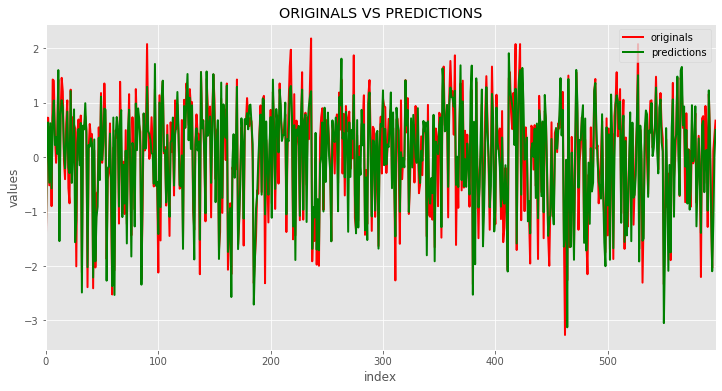

In [74]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
model_call(lr,X_train,y_train,X_test,y_test)

In [75]:
cdf = pd.DataFrame(lr.coef_, X_train.columns, columns=['Coefficients'])
print(cdf)

                        Coefficients
Year                       -0.044660
Is_developing              -0.129885
Adult_Mortality            -0.206102
infant_deaths               1.295588
Alcohol                    -0.071936
percentage_expenditure      0.032222
Hepatitis_B                 0.009021
Measles                    -0.010163
BMI                         0.108224
deaths_u5                  -1.297907
Polio                       0.033417
Total_expenditure           0.017079
Diphtheria                  0.038839
HIV/AIDS                   -0.282416
GDP                         0.032001
Population                 -0.002984
thinness_u19               -0.018671
thinness_u9                -0.014400
Income_composition          0.178675
Schooling                   0.325389


#### 2. Lasso Regression Using Sklearn

In [76]:
alphas = np.logspace(-3,3,num=14) # range for alpha

grid = GridSearchCV(estimator=Lasso(), param_grid=dict(alpha=alphas))
grid.fit(X_train, y_train)

print(grid.best_score_)
print(grid.best_estimator_.alpha)

0.8242156702881009
0.001


Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False) 

r_2 score : 0.8336841321102336 

CV scores: [0.80916546 0.79556477 0.8077768  0.85256651 0.85888949] 

CV scores mean: 0.824792606027188


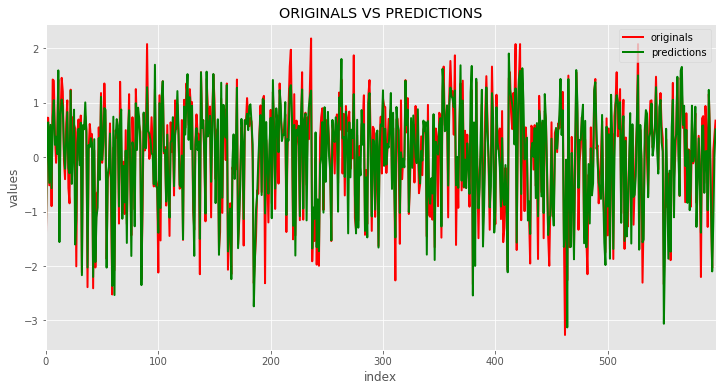

In [77]:
ls = Lasso(alpha = grid.best_estimator_.alpha, normalize = False) # applied the best estimator
model_call(ls,X_train,y_train,X_test,y_test)

In [78]:
lassoCoef=pd.DataFrame()
lassoCoef['Variable']=X_train.columns
lassoCoef['Coef.']=ls.coef_
lassoCoef

,Variable,Coef.
0,Year,-0.044449
1,Is_developing,-0.115025
2,Adult_Mortality,-0.207544
3,infant_deaths,0.903884
4,Alcohol,-0.074609
5,percentage_expenditure,0.032213
6,Hepatitis_B,0.007686
7,Measles,-0.008152
8,BMI,0.109354
9,deaths_u5,-0.909333


##### From above we can see that , Lasso regression changed many no significant Coeffi. to zero

#### 3. Ridge Regression Using Sklearn

In [79]:
alphas = np.logspace(-3,3,num=14) # range for alpha

grid2 = GridSearchCV(estimator=Ridge(), param_grid=dict(alpha=alphas)) 
grid2.fit(X_train, y_train)

print(grid2.best_score_)
print(grid2.best_estimator_.alpha)

0.8240642988109063
0.5878016072274912


Ridge(alpha=0.5878016072274912, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001) 

r_2 score : 0.8337454848503059 

CV scores: [0.81005255 0.7963706  0.80892731 0.85173043 0.85881421] 

CV scores mean: 0.8251790210005222


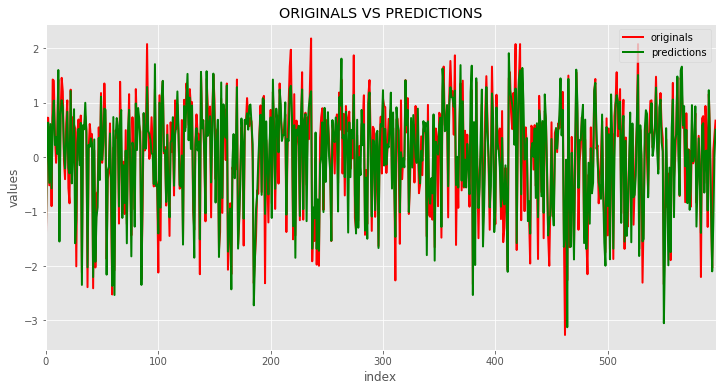

In [80]:
ridge = Ridge(alpha = grid2.best_estimator_.alpha, normalize = False) # applied the best estimator
model_call(ridge,X_train,y_train,X_test,y_test)

#### 3. Decision Tree Regressor Using Sklearn

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best') 

r_2 score : 0.9164442207114712 

CV scores: [0.87911783 0.8901234  0.897184   0.91261282 0.912617  ] 

CV scores mean: 0.8983310093312005


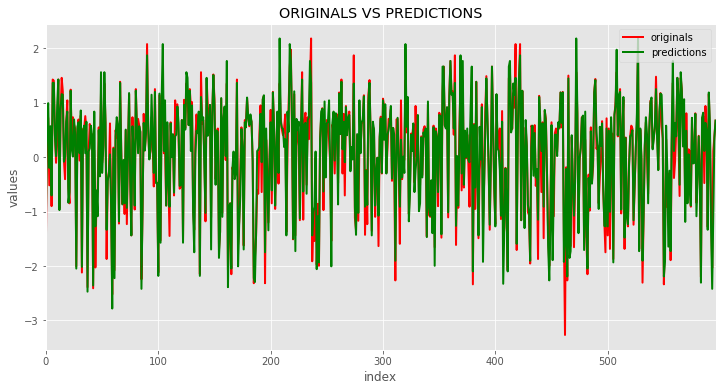

In [81]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()
model_call(dtr,X_train,y_train,X_test,y_test)

In [82]:
dtr.get_params

<bound method BaseEstimator.get_params of DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')>

In [86]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(dtr, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_train.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.pdf')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.397817 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.397817 to fit



#### 5. Random Forest Regressor Using Sklearn

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=42, verbose=0,
                      warm_start=False) 

r_2 score : 0.9612637782924129 

CV scores: [0.93496629 0.96060957 0.94537725 0.96277085 0.95982869] 

CV scores mean: 0.9527105312689228


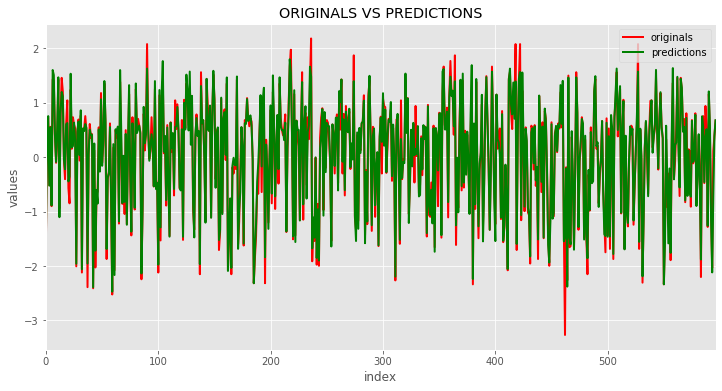

In [84]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators = 100, random_state = 42)
model_call(rf,X_train,y_train,X_test,y_test)

In [85]:
Model = ["LinearRegression","Lasso","Ridge","DecisionTreeRegressor","RandomForestRegressor"]
results=pd.DataFrame({'Model': Model,'R Squared': r_2,'CV score mean': CV})
results

,Model,R Squared,CV score mean
0,LinearRegression,0.833573,0.825110
1,Lasso,0.833684,0.824793
2,Ridge,0.833745,0.825179
3,DecisionTreeRegressor,0.916444,0.898331
4,RandomForestRegressor,0.961264,0.952711
